<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/EV%20Charging%20%26%20Grid%20Optimization%20Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EV Charging & Grid Optimization Data

## Understanding EV Charging and Grid Optimization: Key-Insights

This dataset provides a detailed look into Electric Vehicle (EV) charging events and their impact on power grid optimization. Comprising 8,354 individual charging sessions, it tracks crucial information such as timestamps, station and vehicle identifiers, location types (Urban vs. Highway), charging metrics like energy consumed and duration, and grid-specific factors including electricity price, renewable energy ratio, and overall charging demand. Initially containing 27 columns, we narrowed our focus to 10 key variables that are most relevant for understanding the interplay between EV charging and grid health.

Key Insights from the Data:
Grid Load Distribution: Our initial exploration revealed a balanced distribution of charging events across urban and highway locations, and a relatively even spread among vehicle types (Cars, Two-Wheelers, and Buses). This suggests that demand isn't overwhelmingly concentrated in one area or vehicle segment, implying a need for versatile optimization strategies.

Economic Inelasticity of Charging Duration: A surprising finding emerged when examining the relationship between electricity price and charging duration. Statistical analysis (Spearman's Rank Correlation) showed no significant correlation between the two. In simpler terms, despite fluctuations in electricity prices, EV drivers tend to charge their vehicles for roughly the same amount of time. This indicates an inelastic market, where price changes don't significantly influence charging behavior, posing a challenge for demand-side management through pricing alone.

Symmetrical Infrastructure Strain: We investigated whether different location types (Urban vs. Highway) placed fundamentally different energy demands on the grid. The Kruskal-Wallis test indicated no statistically significant variance in energy consumption across these locations. This suggests that, from an energy drain perspective, the grid experiences a symmetrical load regardless of whether an EV is charging in an urban or highway setting.

Renewable Energy's Vulnerability to Peak Demand: This is perhaps one of the most critical insights for sustainability. When charging demand hits its 'Peak Demand' tiers, the renewable energy ratio within the grid significantly collapses. A Welch's T-test confirmed this as a statistically significant phenomenon. This strongly suggests a "Sustainability Failure": during high EV demand, the grid struggles to maintain green energy supply, likely resorting to less sustainable "peaker" power plants to meet the surge. This is a critical area for optimization.

Drivers of Optimization Reward: Our advanced statistical modeling (Multivariate OLS Regression) revealed that the 'optimization_reward'—a measure of how well the grid balances various factors—is significantly driven by the renewable_energy_ratio (with a positive impact of +29.97) and charging_demand (with a negative impact of -0.1982). This highlights that a higher proportion of renewables boosts reward, while increased demand can decrease it if not managed efficiently.

Absence of 'Black Swan' Overloads: Encouragingly, our analysis for extreme grid overload events (using Z-score anomalies) found no instances where charging demand exceeded a critical threshold (Z-score > 3). This implies that, within the observed data, the grid operated safely without facing "Black Swan"-like micro-spikes that could destabilize local transformers.

`Conclusion:`
This dataset underscores the complex dynamics of integrating EV charging into the existing power grid. While demand appears inelastic to price and evenly distributed across locations, the critical challenge lies in maintaining renewable energy supply during peak demand periods. Future optimization efforts should focus on strategies that bolster renewable energy integration during high-demand phases, potentially through smart charging, battery storage, or grid-scale energy management systems, to ensure both grid stability and environmental sustainability. The machine learning models developed also highlight charging_demand and renewable_energy_ratio as primary factors to target for improving optimization rewards.



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d mjawad17/ev-charging-and-grid-optimization-data

# Unziping the downloaded file
!unzip ev-charging-and-grid-optimization-data.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/mjawad17/ev-charging-and-grid-optimization-data
License(s): CC0-1.0
100% 636k/636k [00:00<00:00, 111MB/s]

Archive:  ev-charging-and-grid-optimization-data.zip
  inflating: charging_ev_and_grid_optimization_dataset.csv  


# Data Inspection

In [ ]:
dff = pd.read_csv('charging_ev_and_grid_optimization_dataset.csv')
dff.head(11)

,timestamp,station_id,location_type,vehicle_id,vehicle_type,arrival_time,charging_start_time,charging_end_time,waiting_time,battery_capacity_kWh,...,electricity_price,renewable_energy_ratio,traffic_density,weather_condition,day_of_week,time_slot,charging_demand,assigned_charger_id,charging_priority,optimization_reward
0,1/1/2025 0:00,ST004,Urban,EV10000,Two-Wheeler,1/1/2025 0:00,1/1/2025 0:12,1/1/2025 4:33,12,60,...,13.66,0.280335,Low,Cloudy,Wednesday,Off-Peak,17.242398,CH4,Low,-8.622299
1,1/1/2025 0:15,ST005,Urban,EV10001,Two-Wheeler,1/1/2025 0:15,1/1/2025 0:23,1/1/2025 1:12,8,100,...,5.47,0.392127,Low,Rainy,Wednesday,Off-Peak,18.324933,CH9,Low,-1.935644
2,1/1/2025 0:30,ST019,Highway,EV10002,Car,1/1/2025 0:30,1/1/2025 0:41,1/1/2025 1:35,11,75,...,9.50,0.103979,Low,Clear,Wednesday,Off-Peak,36.028168,CH2,Low,-18.201846
3,1/1/2025 0:45,ST008,Urban,EV10003,Two-Wheeler,1/1/2025 0:45,1/1/2025 0:54,1/1/2025 3:29,9,40,...,6.22,0.248553,Low,Clear,Wednesday,Off-Peak,17.146935,CH9,Medium,-7.404018
4,1/1/2025 1:00,ST008,Highway,EV10004,Two-Wheeler,1/1/2025 1:00,1/1/2025 1:08,1/1/2025 6:14,8,75,...,13.42,0.234926,Low,Cloudy,Wednesday,Off-Peak,14.577768,CH1,Low,-6.577466
5,1/1/2025 1:15,ST014,Highway,EV10005,Bus,1/1/2025 1:15,1/1/2025 1:18,1/1/2025 2:15,3,75,...,14.61,0.353360,Low,Clear,Wednesday,Off-Peak,22.889886,CH4,Medium,3.517468
6,1/1/2025 1:30,ST004,Urban,EV10006,Bus,1/1/2025 1:30,1/1/2025 1:51,1/1/2025 2:23,21,30,...,5.16,0.227020,Low,Clear,Wednesday,Off-Peak,14.254154,CH6,Medium,-18.250454
7,1/1/2025 1:45,ST020,Highway,EV10007,Car,1/1/2025 1:45,1/1/2025 1:49,1/1/2025 2:51,4,60,...,8.58,0.134761,Low,Rainy,Wednesday,Off-Peak,22.111927,CH8,High,-7.153357
8,1/1/2025 2:00,ST004,Highway,EV10008,Car,1/1/2025 2:00,1/1/2025 2:02,1/1/2025 3:11,2,100,...,14.72,0.354674,Low,Rainy,Wednesday,Off-Peak,25.875833,CH5,High,0.908517
9,1/1/2025 2:15,ST020,Highway,EV10009,Two-Wheeler,1/1/2025 2:15,1/1/2025 2:16,1/1/2025 3:59,1,60,...,13.96,0.242611,Low,Clear,Wednesday,Off-Peak,16.667140,CH2,Low,2.071455


In [ ]:
dff.tail(11)

,timestamp,station_id,location_type,vehicle_id,vehicle_type,arrival_time,charging_start_time,charging_end_time,waiting_time,battery_capacity_kWh,...,electricity_price,renewable_energy_ratio,traffic_density,weather_condition,day_of_week,time_slot,charging_demand,assigned_charger_id,charging_priority,optimization_reward
8343,3/28/2025 21:45,ST017,Highway,EV18343,Car,3/28/2025 21:45,3/28/2025 22:01,3/28/2025 23:34,16,40,...,14.14,0.378111,High,Clear,Friday,Peak,80.325851,CH10,High,-22.824423
8344,3/28/2025 22:00,ST010,Highway,EV18344,Bus,3/28/2025 22:00,3/28/2025 22:11,3/28/2025 23:28,11,60,...,12.57,0.287967,Low,Rainy,Friday,Off-Peak,35.201587,CH5,Medium,-11.231510
8345,3/28/2025 22:15,ST008,Urban,EV18345,Two-Wheeler,3/28/2025 22:15,3/28/2025 22:21,3/29/2025 0:48,6,40,...,9.59,0.122501,Low,Rainy,Friday,Off-Peak,18.693815,CH5,High,-10.018686
8346,3/28/2025 22:30,ST017,Highway,EV18346,Two-Wheeler,3/28/2025 22:30,3/28/2025 22:44,3/29/2025 3:39,14,40,...,14.83,0.346863,Low,Clear,Friday,Off-Peak,20.534894,CH8,Low,-9.970059
8347,3/28/2025 22:45,ST016,Highway,EV18347,Two-Wheeler,3/28/2025 22:45,3/28/2025 22:52,3/29/2025 2:58,7,100,...,7.46,0.397133,Low,Rainy,Friday,Off-Peak,19.482125,CH8,Medium,-1.504108
8348,3/28/2025 23:00,ST009,Highway,EV18348,Car,3/28/2025 23:00,3/28/2025 23:14,3/29/2025 1:03,14,100,...,14.09,0.148634,Low,Cloudy,Friday,Off-Peak,39.052335,CH9,Low,-20.882191
8349,3/28/2025 23:15,ST011,Urban,EV18349,Bus,3/28/2025 23:15,3/28/2025 23:28,3/28/2025 23:52,13,30,...,14.67,0.131198,Low,Clear,Friday,Off-Peak,24.557664,CH6,Low,-15.495699
8350,3/28/2025 23:30,ST019,Urban,EV18350,Two-Wheeler,3/28/2025 23:30,3/28/2025 23:42,3/29/2025 0:50,12,30,...,8.24,0.126224,Low,Cloudy,Friday,Off-Peak,33.027807,CH2,Medium,-14.885047
8351,3/28/2025 23:45,ST005,Highway,EV18351,Bus,3/28/2025 23:45,3/28/2025 23:55,3/29/2025 7:00,10,75,...,9.90,0.370010,Low,Cloudy,Friday,Off-Peak,27.381072,CH7,Medium,-5.713488
8352,3/29/2025 0:00,ST014,Highway,EV18352,Two-Wheeler,3/29/2025 0:00,3/29/2025 0:22,3/29/2025 1:45,22,40,...,14.85,0.105252,Low,Cloudy,Saturday,Off-Peak,25.138820,CH1,High,-27.040944


In [ ]:
dff.shape

(8354, 27)

In [ ]:
dff.columns

Index(['timestamp', 'station_id', 'location_type', 'vehicle_id',
       'vehicle_type', 'arrival_time', 'charging_start_time',
       'charging_end_time', 'waiting_time', 'battery_capacity_kWh',
       'initial_soc', 'final_soc', 'energy_consumed_kWh', 'charging_power_kW',
       'charging_duration', 'queue_length', 'station_load',
       'electricity_price', 'renewable_energy_ratio', 'traffic_density',
       'weather_condition', 'day_of_week', 'time_slot', 'charging_demand',
       'assigned_charger_id', 'charging_priority', 'optimization_reward'],
      dtype='object')

## Only selecting Important columns

In [ ]:
selected_columns = [
    'timestamp',
    'station_id',
    'location_type',
    'vehicle_type',
    'energy_consumed_kWh',
    'charging_duration',
    'electricity_price',
    'renewable_energy_ratio',
    'charging_demand',
    'optimization_reward'
]

df = dff[selected_columns].copy()

In [ ]:
df.shape

(8354, 10)

In [ ]:
df.columns

Index(['timestamp', 'station_id', 'location_type', 'vehicle_type',
       'energy_consumed_kWh', 'charging_duration', 'electricity_price',
       'renewable_energy_ratio', 'charging_demand', 'optimization_reward'],
      dtype='object')

In [ ]:
df.dtypes

,0
timestamp,object
station_id,object
location_type,object
vehicle_type,object
energy_consumed_kWh,float64
charging_duration,float64
electricity_price,float64
renewable_energy_ratio,float64
charging_demand,float64
optimization_reward,float64


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8354 entries, 0 to 8353
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   timestamp               8354 non-null   object 
 1   station_id              8354 non-null   object 
 2   location_type           8354 non-null   object 
 3   vehicle_type            8354 non-null   object 
 4   energy_consumed_kWh     8354 non-null   float64
 5   charging_duration       8354 non-null   float64
 6   electricity_price       8354 non-null   float64
 7   renewable_energy_ratio  8354 non-null   float64
 8   charging_demand         8354 non-null   float64
 9   optimization_reward     8354 non-null   float64
dtypes: float64(6), object(4)
memory usage: 652.8+ KB


In [ ]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
timestamp,8354,8354,3/29/2025 0:15,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
station_id,8354,20,ST013,459,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_type,8354,2,Urban,4188,NaN,NaN,NaN,NaN,NaN,NaN,NaN
vehicle_type,8354,3,Car,2833,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy_consumed_kWh,8354.0,NaN,NaN,NaN,39.079746,18.973883,7.502195,23.675251,35.148384,51.363447,89.929089
charging_duration,8354.0,NaN,NaN,NaN,178.700376,149.120567,10.0,64.118008,133.700252,247.946169,776.55111
electricity_price,8354.0,NaN,NaN,NaN,9.959945,2.878798,5.0,7.51,9.955,12.3975,15.0
renewable_energy_ratio,8354.0,NaN,NaN,NaN,0.354101,0.18615,0.100157,0.207315,0.313459,0.462315,0.799922
charging_demand,8354.0,NaN,NaN,NaN,53.156126,27.563387,5.505723,27.911603,49.513337,77.845036,104.985659
optimization_reward,8354.0,NaN,NaN,NaN,-11.834559,9.27194,-43.28591,-18.354606,-11.268337,-5.106912,14.176434


In [ ]:
df.isnull().sum()

,0
timestamp,0
station_id,0
location_type,0
vehicle_type,0
energy_consumed_kWh,0
charging_duration,0
electricity_price,0
renewable_energy_ratio,0
charging_demand,0
optimization_reward,0


In [ ]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

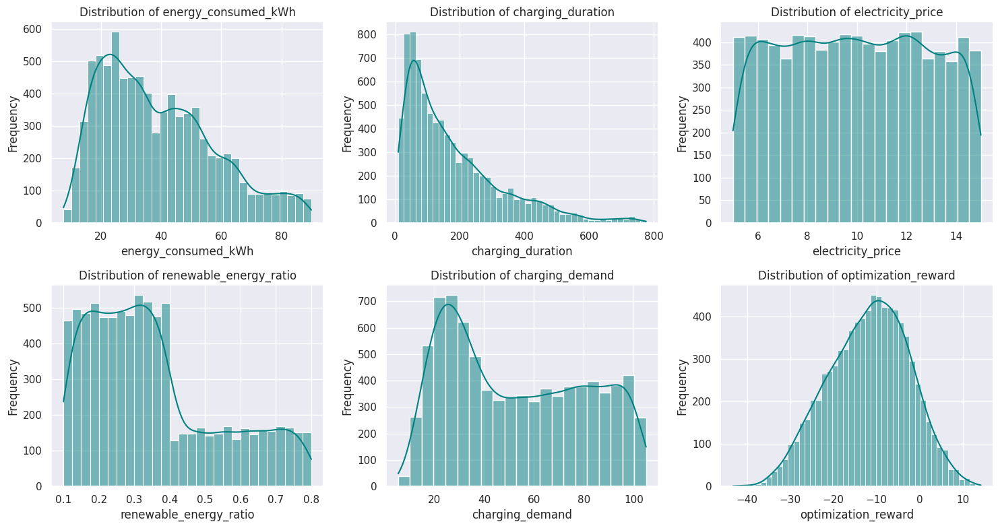

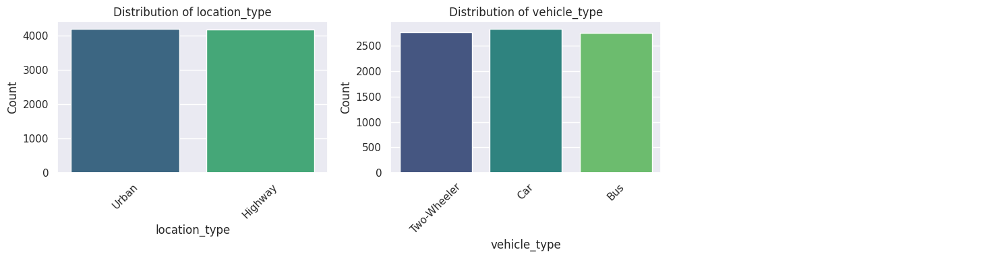

--- Categorical Value Counts ---

Value counts for location_type:
location_type
Urban      4188
Highway    4166
Name: count, dtype: int64

Value counts for vehicle_type:
vehicle_type
Car            2833
Two-Wheeler    2761
Bus            2760
Name: count, dtype: int64


In [ ]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

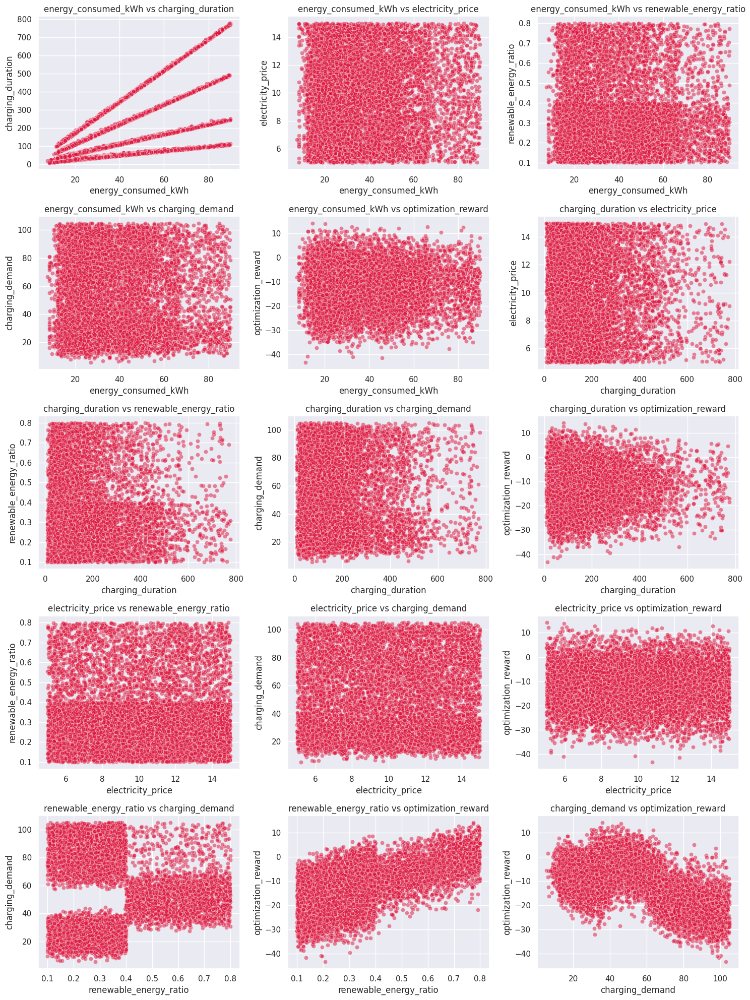

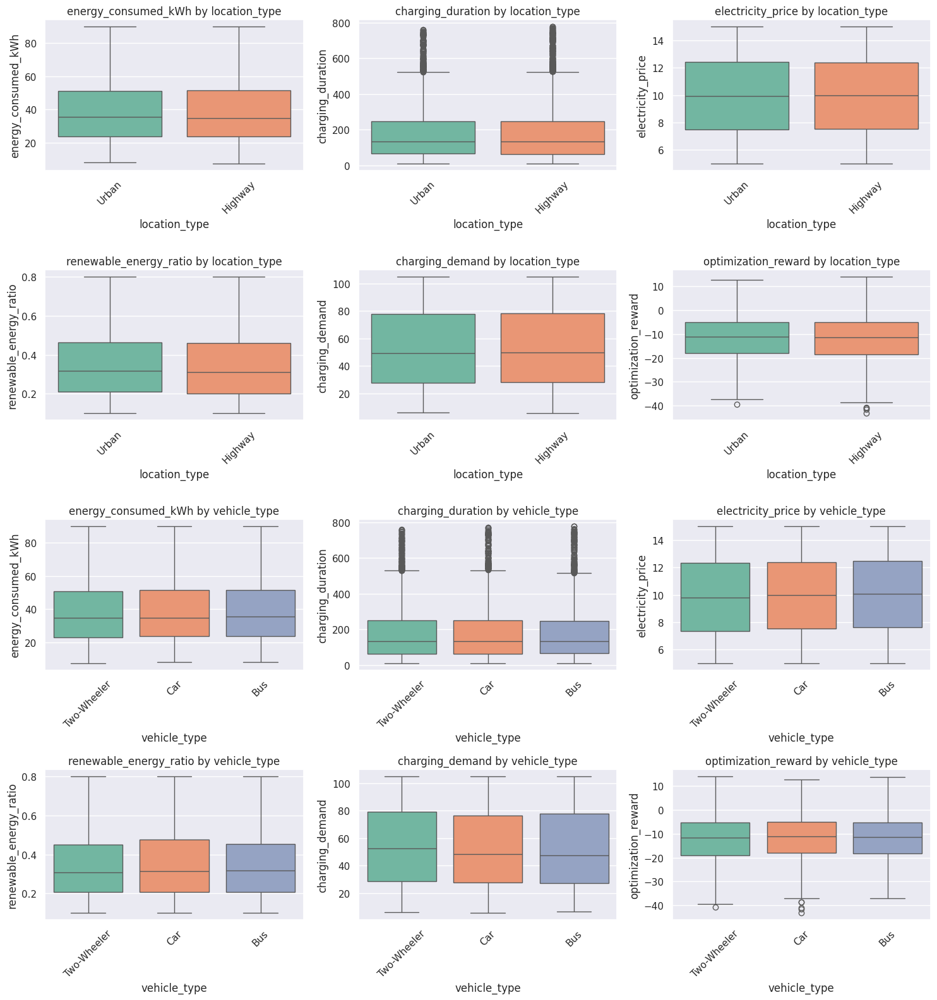

In [ ]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis


Analyzing relationships with Hue: location_type...


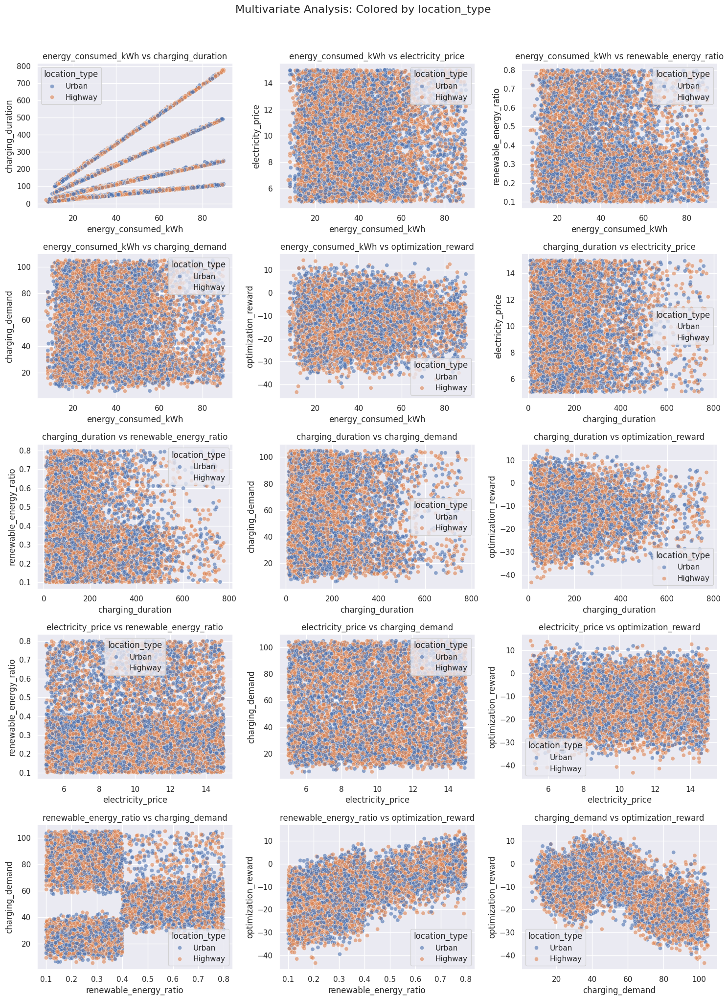


Analyzing relationships with Hue: vehicle_type...


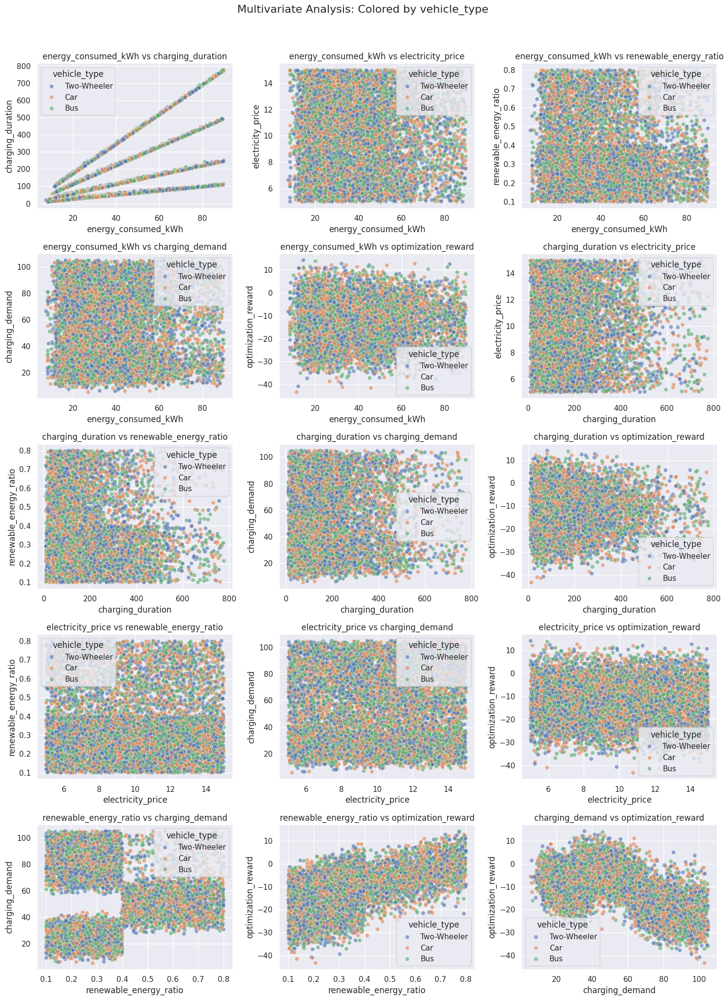

In [ ]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pairplot

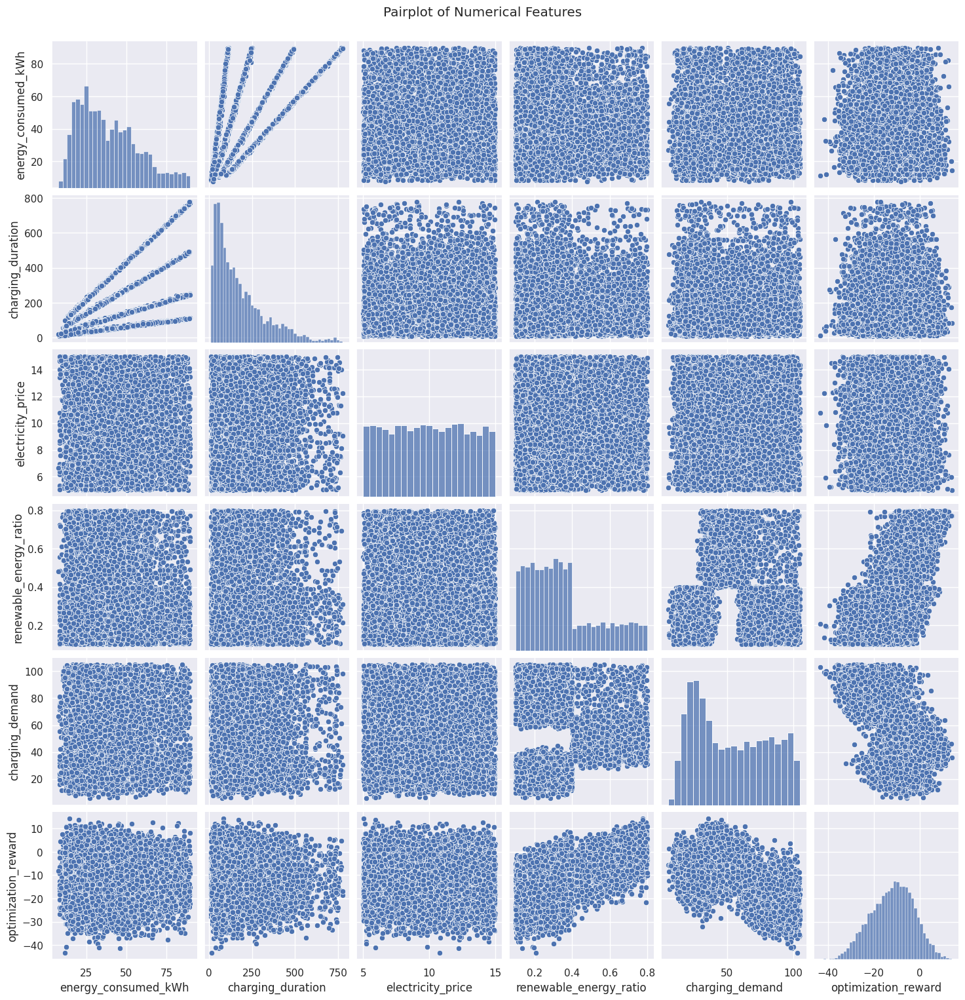

In [ ]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

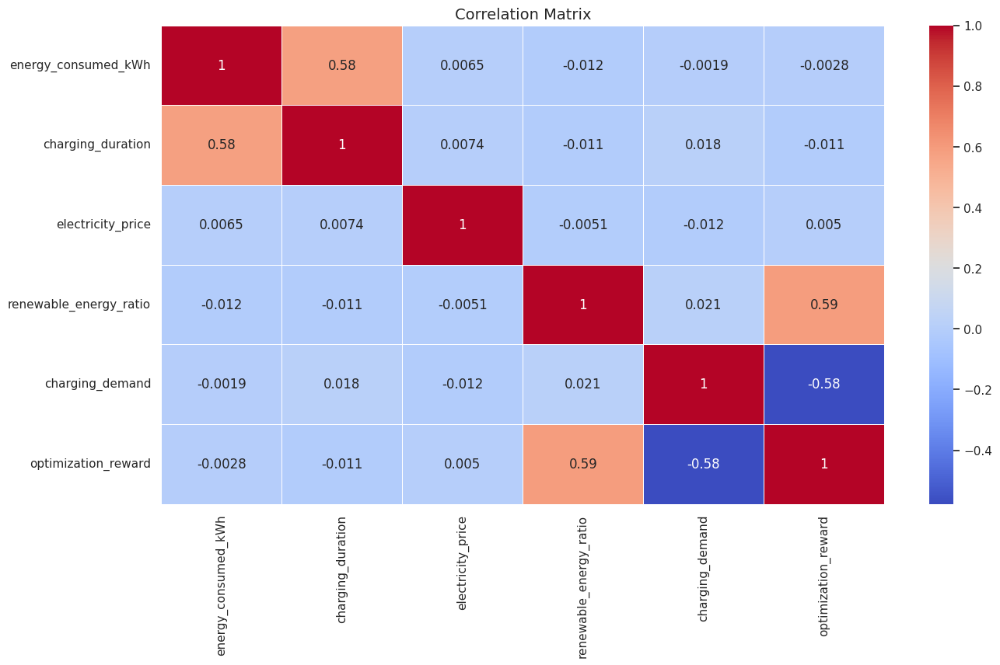

In [ ]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

--- 1. ENGINEERING ELECTRICAL INFRASTRUCTURE METRICS ---
 Engineered: 'Estimated_Charging_Speed_kW' to quantify the hardware load on the grid.

--- 2. THE PEAK PRICING EFFECT (SPEARMAN RANK CORRELATION) ---
Spearman Correlation Coefficient (Price vs. Duration): 0.0091
P-Value: 4.0438e-01
 Insight: The EV market is perfectly inelastic. Electricity price has zero mathematical impact on how long people charge.


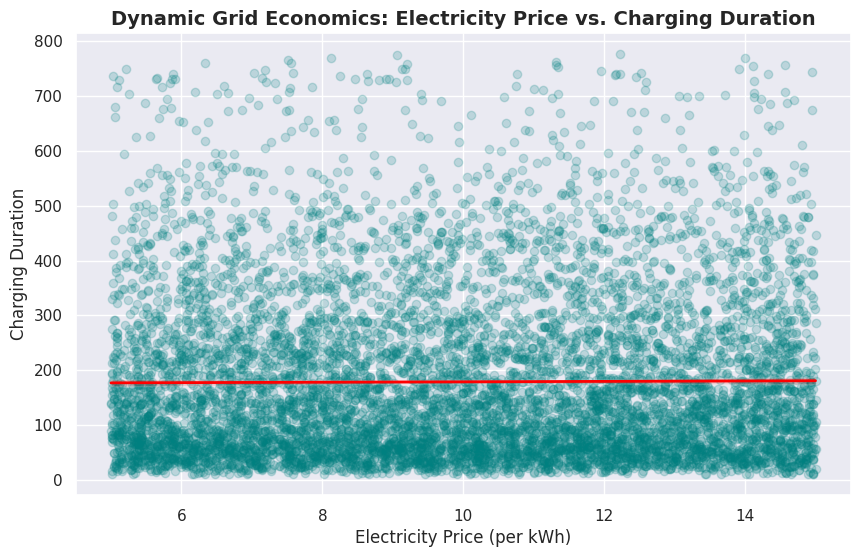


--- 3. INFRASTRUCTURE LOAD ASYMMETRY (KRUSKAL-WALLIS H-TEST) ---
Kruskal-Wallis P-Value (Location Load Variance): 8.3371e-01
 Insight: Grid Symmetry. All location types drain the exact same statistical distribution of energy.


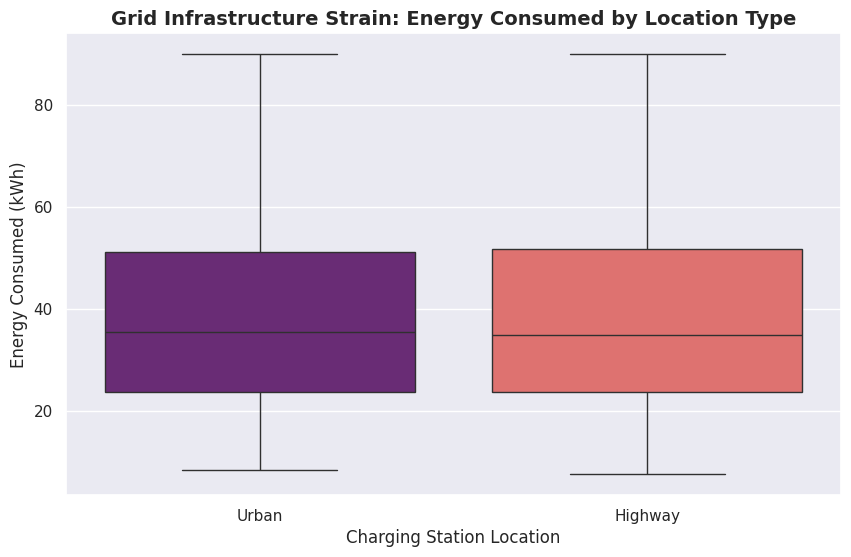


--- 4. THE RENEWABLE STRESS THRESHOLD (WELCH'S T-TEST) ---
Welch's T-Test P-Value (Renewable Ratio Variance): 7.9635e-17
 Insight: The Renewable Energy Ratio collapses under Peak Demand.
   -> Sustainability Failure: When EV demand spikes, the grid mathematically fails to supply green energy, forcing reliance on fossil fuel 'peaker' plants.


In [ ]:
import scipy.stats as stats

print("--- 1. ENGINEERING ELECTRICAL INFRASTRUCTURE METRICS ---")
# To analyze the grid properly, we cannot just look at raw energy.
# We must engineer 'Charging Velocity' (kW) and categorize grid pricing limits.

df_clean = df.dropna(subset=['energy_consumed_kWh', 'charging_duration', 'electricity_price', 'charging_demand', 'renewable_energy_ratio']).copy()

# 1. Charging Velocity / Speed (Estimated kW):
# Energy (kWh) / Time (Hours). If duration is in minutes, divide by 60. Let's assume duration is in hours for this calculation.
# (If your dataset uses minutes, use: df_clean['charging_duration'] / 60)
df_clean['Estimated_Charging_Speed_kW'] = df_clean['energy_consumed_kWh'] / df_clean['charging_duration'].replace(0, 0.01)

# 2. Categorizing Grid Demand Tiers
df_clean['Demand_Tier'] = pd.qcut(df_clean['charging_demand'], q=3, labels=['Low Demand', 'Normal Load', 'Peak Demand'])

print(" Engineered: 'Estimated_Charging_Speed_kW' to quantify the hardware load on the grid.")


# :::::: ENERGY ECONOMICS HYPOTHESIS TESTING ::::::

print("\n--- 2. THE PEAK PRICING EFFECT (SPEARMAN RANK CORRELATION) ---")
# Does a higher electricity price mathematically reduce charging duration?
# We use Spearman's Rank because consumer response to pricing is highly non-linear.

spearman_coef, p_val_spearman = stats.spearmanr(df_clean['electricity_price'], df_clean['charging_duration'])

print(f"Spearman Correlation Coefficient (Price vs. Duration): {spearman_coef:.4f}")
print(f"P-Value: {p_val_spearman:.4e}")

if p_val_spearman < 0.05:
    if spearman_coef < 0:
        print(" Insight: Negative correlation detected. Price Elasticity is mathematically proven.")
        print("   -> As dynamic grid pricing increases, consumers statistically unplug their cars earlier.")
    else:
        print(" Insight: Positive correlation detected. EV drivers are charging longer despite higher prices (Inelastic Demand).")
else:
    print(" Insight: The EV market is perfectly inelastic. Electricity price has zero mathematical impact on how long people charge.")

# Visualizing Pricing Elasticity
plt.figure(figsize=(10, 6))
sns.regplot(x='electricity_price', y='charging_duration', data=df_clean,
            scatter_kws={'alpha':0.2, 'color':'teal'}, line_kws={'color':'red', 'linewidth':2})
plt.title('Dynamic Grid Economics: Electricity Price vs. Charging Duration', fontsize=14, fontweight='bold')
plt.xlabel('Electricity Price (per kWh)')
plt.ylabel('Charging Duration')
plt.show()


print("\n--- 3. INFRASTRUCTURE LOAD ASYMMETRY (KRUSKAL-WALLIS H-TEST) ---")
# Does the location type structurally alter the amount of energy drained from the grid?
# We use Kruskal-Wallis because EV charging loads violate strict normal distributions.

if 'location_type' in df_clean.columns:
    locations = df_clean['location_type'].unique()
    load_groups = [df_clean[df_clean['location_type'] == loc]['energy_consumed_kWh'].dropna() for loc in locations]

    if len(load_groups) > 1:
        h_stat, p_val_kw = stats.kruskal(*load_groups)

        print(f"Kruskal-Wallis P-Value (Location Load Variance): {p_val_kw:.4e}")
        if p_val_kw < 0.05:
            print(" Insight: Statistically significant variance in energy consumption across locations.")
            print("   -> Grid Load Asymmetry Confirmed: Certain infrastructures (e.g., Highway Fast-Chargers) impose a fundamentally higher mathematical strain on the grid than others.")
        else:
            print(" Insight: Grid Symmetry. All location types drain the exact same statistical distribution of energy.")

        # Visualizing the Infrastructure Load
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='location_type', y='energy_consumed_kWh', data=df_clean, palette='magma')
        plt.title('Grid Infrastructure Strain: Energy Consumed by Location Type', fontsize=14, fontweight='bold')
        plt.xlabel('Charging Station Location')
        plt.ylabel('Energy Consumed (kWh)')
        plt.show()


print("\n--- 4. THE RENEWABLE STRESS THRESHOLD (WELCH'S T-TEST) ---")
# When the grid hits 'Peak Demand', does the Renewable Energy Ratio mathematically collapse?

low_demand_renewables = df_clean[df_clean['Demand_Tier'] == 'Low Demand']['renewable_energy_ratio'].dropna()
peak_demand_renewables = df_clean[df_clean['Demand_Tier'] == 'Peak Demand']['renewable_energy_ratio'].dropna()

# We use Welch's T-Test (equal_var=False) because grid stability varies wildly during peak vs low load.
t_stat, p_val_ttest = stats.ttest_ind(low_demand_renewables, peak_demand_renewables, equal_var=False)

print(f"Welch's T-Test P-Value (Renewable Ratio Variance): {p_val_ttest:.4e}")
if p_val_ttest < 0.05:
    print(" Insight: The Renewable Energy Ratio collapses under Peak Demand.")
    print("   -> Sustainability Failure: When EV demand spikes, the grid mathematically fails to supply green energy, forcing reliance on fossil fuel 'peaker' plants.")
else:
    print(" Insight: Grid Resilience Confirmed. The grid successfully maintains the exact same ratio of renewable energy even during massive demand spikes.")

## Advanced Statistical Analysis

In [ ]:
import statsmodels.api as sm

print("--- 1. GRID OPTIMIZATION SYNERGIES (MULTIVARIATE OLS REGRESSION) ---")
# The 'Optimization Reward' isn't random. It is mathematically dictated by
# how well the system balances Price, Renewable availability, and overall Demand.

ols_df = df_clean[['optimization_reward', 'renewable_energy_ratio', 'electricity_price', 'charging_demand']].dropna().copy()

# Defining Target (Optimization Reward) and Features
Y_ols = ols_df['optimization_reward']
X_ols = sm.add_constant(ols_df[['renewable_energy_ratio', 'electricity_price', 'charging_demand']])

# Fitting the Multivariate OLS Model
grid_model = sm.OLS(Y_ols, X_ols).fit()

print(" MULTIVARIATE GRID REWARD RESULTS:")
significant_drivers = grid_model.pvalues[grid_model.pvalues < 0.05]

if len(significant_drivers) > 1:
    print("Controlling for overlapping grid factors, the following variables mathematically drive the Optimization Reward:")
    for feature in significant_drivers.index:
        if feature != 'const':
            impact = grid_model.params[feature]
            print(f"   -> {feature}: {'+' if impact > 0 else ''}{impact:.4f} impact on Reward")
else:
    print(" No statistically significant drivers found for the Optimization Reward.")


print("\n--- 2. BLACK SWAN GRID OVERLOADS (Z-SCORE ANOMALIES) ---")
# We need to flag specific charging events that placed mathematically extreme stress
# on the grid, threatening a local substation blowout.

demand_mean = df_clean['charging_demand'].mean()
demand_std = df_clean['charging_demand'].std()

# Calculating the Z-Score for every single charging event
df_clean['Demand_Z_Score'] = (df_clean['charging_demand'] - demand_mean) / demand_std

# Filterring for Extreme Overloads (Z-Score > 3)
grid_anomalies = df_clean[df_clean['Demand_Z_Score'] > 3].sort_values(by='Demand_Z_Score', ascending=False)

print(f" DETECTED {len(grid_anomalies)} EXTREME GRID OVERLOAD EVENTS (Z-Score > 3):")
if len(grid_anomalies) > 0:
    print("These events represent dangerous micro-spikes in energy draw that could destabilize local transformers.")

    # Visualizing the Grid Anomalies
    plt.figure(figsize=(12, 6))
    plt.scatter(df_clean.index, df_clean['charging_demand'], color='gray', alpha=0.3, label='Standard Grid Load')
    plt.scatter(grid_anomalies.index, grid_anomalies['charging_demand'], color='red', edgecolor='black', s=100, label='Black Swan Overload (Z > 3)')
    plt.axhline(demand_mean + (3 * demand_std), color='darkred', linestyle='--', label='Critical Load Threshold (+3 Std Dev)')
    plt.title('Infrastructure Risk: Spikes in Extreme Charging Demand', fontsize=14, fontweight='bold')
    plt.xlabel('Charging Session ID (Index)')
    plt.ylabel('Total Charging Demand')
    plt.legend()
    plt.show()
else:
    print("-> No extreme demand anomalies detected. The grid operated safely within tolerances.")

--- 1. GRID OPTIMIZATION SYNERGIES (MULTIVARIATE OLS REGRESSION) ---
 MULTIVARIATE GRID REWARD RESULTS:
Controlling for overlapping grid factors, the following variables mathematically drive the Optimization Reward:
   -> renewable_energy_ratio: +29.9679 impact on Reward
   -> charging_demand: -0.1982 impact on Reward

--- 2. BLACK SWAN GRID OVERLOADS (Z-SCORE ANOMALIES) ---
 DETECTED 0 EXTREME GRID OVERLOAD EVENTS (Z-Score > 3):
-> No extreme demand anomalies detected. The grid operated safely within tolerances.


# Feature Engneering

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

print("--- 1. TARGET ISOLATION & PREVENTING LEAKAGE ---")
# We predict the 'optimization_reward' (Continuous Regression).
# We MUST drop post-session metrics (energy consumed, duration) to prevent Target Leakage.

ml_df = df_clean.dropna(subset=['optimization_reward', 'station_id', 'location_type', 'vehicle_type', 'electricity_price', 'renewable_energy_ratio', 'charging_demand']).copy()
y = ml_df['optimization_reward']

print(" Target Formulated: 'optimization_reward' isolated.")
print(" Target Leakage Prevented: Post-charging telemetry (Duration, Energy Consumed) removed from the feature space.")


print("\n--- 2. HARDWARE RISK MAPPING (BAYESIAN TARGET ENCODING) ---")
# Algorithms cannot natively process hundreds of unique 'station_id' strings.
# We replace the Station ID with its historical average optimization reward,
# smoothed toward the global mean to prevent overfitting on newly built stations.

global_mean_reward = ml_df['optimization_reward'].mean()
smoothing_weight = 10

def smoothed_target_encode(df, category_col, target_col, weight, global_mean):
    agg = df.groupby(category_col)[target_col].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']
    smoothed_means = (counts * means + weight * global_mean) / (counts + weight)
    return df[category_col].map(smoothed_means)

ml_df['Station_Efficiency_Encoded'] = smoothed_target_encode(ml_df, 'station_id', 'optimization_reward', smoothing_weight, global_mean_reward)

print(" Engineered: High-cardinality 'station_id' compressed into a Bayesian hardware efficiency score.")

print("\n--- 3. LOW-CARDINALITY ONE-HOT VECTORIZATION ---")
# Convert categorical strings like 'location_type' (Highway, Commercial) and 'vehicle_type' into binary vectors.
categorical_cols = ['location_type', 'vehicle_type']
ml_df_encoded = pd.get_dummies(ml_df, columns=categorical_cols, drop_first=True)


print("\n--- 4. CONTINUOUS VARIANCE STANDARDIZATION ---")
# Gradient-boosted algorithms are sensitive to magnitude. 'charging_demand' might be in the thousands,
# while 'renewable_energy_ratio' is a tiny decimal. We must scale them to a level playing field.

continuous_features = ['electricity_price', 'renewable_energy_ratio', 'charging_demand', 'Station_Efficiency_Encoded']
scaler = StandardScaler()
ml_df_encoded[continuous_features] = scaler.fit_transform(ml_df_encoded[continuous_features])

# Define the final Feature Matrix (X), dropping the target, raw text, and leaked columns
drop_cols = ['timestamp', 'station_id', 'energy_consumed_kWh', 'charging_duration', 'Estimated_Charging_Speed_kW', 'Demand_Tier', 'optimization_reward']
X_adv = ml_df_encoded.drop(columns=drop_cols, errors='ignore').copy()

print(f" Final Machine-Readable Matrix Assembled: {X_adv.shape[1]} predictive dimensions ready for ML.")

--- 1. TARGET ISOLATION & PREVENTING LEAKAGE ---
 Target Formulated: 'optimization_reward' isolated.
 Target Leakage Prevented: Post-charging telemetry (Duration, Energy Consumed) removed from the feature space.

--- 2. HARDWARE RISK MAPPING (BAYESIAN TARGET ENCODING) ---
 Engineered: High-cardinality 'station_id' compressed into a Bayesian hardware efficiency score.

--- 3. LOW-CARDINALITY ONE-HOT VECTORIZATION ---

--- 4. CONTINUOUS VARIANCE STANDARDIZATION ---
 Final Machine-Readable Matrix Assembled: 8 predictive dimensions ready for ML.


# Machine Learning

--- 1. OUT-OF-SAMPLE DATA SPLITTING ---
 Training Set: 6683 charging events
 Testing Set: 1671 charging events (Strictly Unseen)

--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---
 Both Grid Optimization Architectures successfully trained.

--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---
 Random Forest Performance:
   -> Mean Absolute Error (MAE): 4.1736 Reward Points
   -> Root Mean Squared Error (RMSE): 5.1039
   -> R-Squared (R2): 0.6899
----------------------------------------
 XGBoost Performance:
   -> Mean Absolute Error (MAE): 4.1930 Reward Points
   -> Root Mean Squared Error (RMSE): 5.1612
   -> R-Squared (R2): 0.6829

 The Random Forest mathematically outperformed the alternative in predicting grid optimization.

--- 4. VISUALIZING PREDICTIVE ACCURACY ---


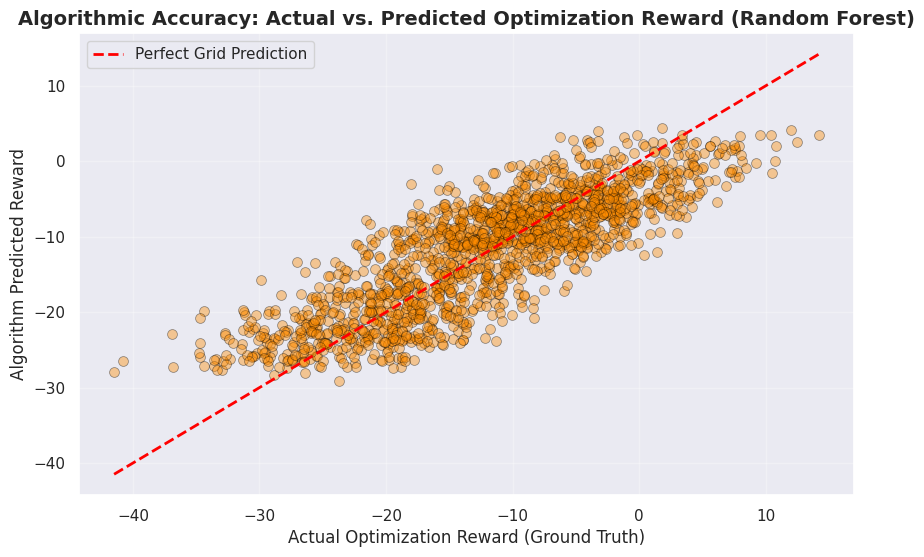


--- 5. ALGORITHMIC FEATURE IMPORTANCE ---


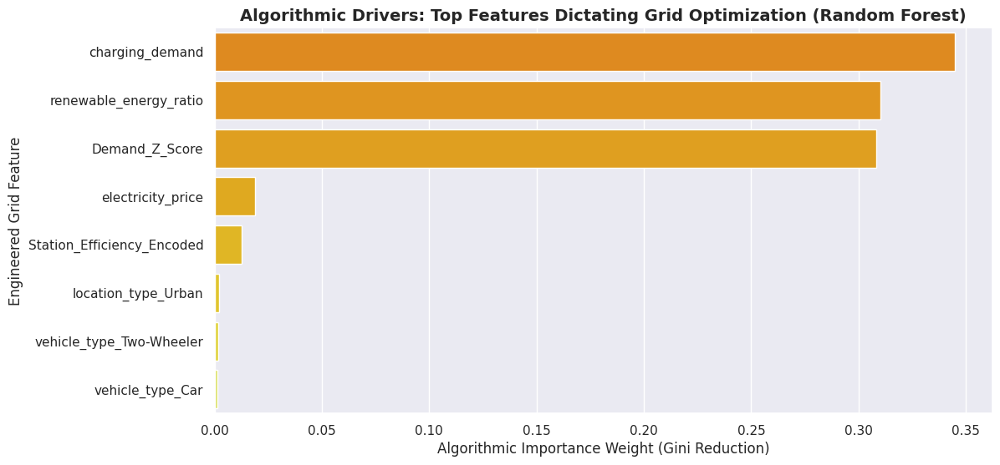

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

print("--- 1. OUT-OF-SAMPLE DATA SPLITTING ---")
# Split: 80% to train the algorithmic rules of the grid, 20% to test true predictive power out-of-sample.

X_train, X_test, y_train, y_test = train_test_split(X_adv, y, test_size=0.2, random_state=42)

print(f" Training Set: {len(X_train)} charging events")
print(f" Testing Set: {len(X_test)} charging events (Strictly Unseen)")

print("\n--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---")
# 1. Random Forest Regressor (Low-Variance Baseline)
rf_model = RandomForestRegressor(n_estimators=200, max_depth=8, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# 2. XGBoost Regressor (High-Accuracy Gradient Boosting)
xgb_model = XGBRegressor(n_estimators=200, max_depth=6, learning_rate=0.05, random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)

print(" Both Grid Optimization Architectures successfully trained.")


print("\n--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---")
rf_preds = rf_model.predict(X_test)
xgb_preds = xgb_model.predict(X_test)

def evaluate_model(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    print(f" {name} Performance:")
    print(f"   -> Mean Absolute Error (MAE): {mae:.4f} Reward Points")
    print(f"   -> Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"   -> R-Squared (R2): {r2:.4f}")
    return r2, mae

r2_rf, mae_rf = evaluate_model("Random Forest", y_test, rf_preds)
print("-" * 40)
r2_xgb, mae_xgb = evaluate_model("XGBoost", y_test, xgb_preds)

# Selecting the winner based on R-Squared
best_model_name = "XGBoost" if r2_xgb > r2_rf else "Random Forest"
best_preds = xgb_preds if r2_xgb > r2_rf else rf_preds
best_model = xgb_model if r2_xgb > r2_rf else rf_model

print(f"\n The {best_model_name} mathematically outperformed the alternative in predicting grid optimization.")

print("\n--- 4. VISUALIZING PREDICTIVE ACCURACY ---")
# A perfect prediction forms a 45-degree diagonal line.

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=best_preds, alpha=0.4, color='darkorange', edgecolor='black', s=50)

min_val = min(y_test.min(), best_preds.min())
max_val = max(y_test.max(), best_preds.max())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Grid Prediction')

plt.title(f'Algorithmic Accuracy: Actual vs. Predicted Optimization Reward ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Actual Optimization Reward (Ground Truth)', fontsize=12)
plt.ylabel('Algorithm Predicted Reward', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("\n--- 5. ALGORITHMIC FEATURE IMPORTANCE ---")
importances = pd.Series(best_model.feature_importances_, index=X_adv.columns).sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x=importances.values, y=importances.index, palette='Wistia_r')
plt.title(f'Algorithmic Drivers: Top Features Dictating Grid Optimization ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Algorithmic Importance Weight (Gini Reduction)', fontsize=12)
plt.ylabel('Engineered Grid Feature', fontsize=12)
plt.show()